# IMPORT LIBRARIES AND DATASETS

In [2]:
# Import key librares and modules 
import pandas as pd
import numpy as np

# Import datetime module that comes pre-installed in Python 
# datetime offers classes that work with date & time information
import datetime as dt

In [3]:
stock_df = pd.read_csv('dataset\Amazon.csv')
stock_df.tail(15)

,Date,Open,High,Low,Close,Volume,Adj Close
1235,11/28/2022,93.930000,96.400002,93.430000,93.949997,74943100,93.949997
1236,11/29/2022,94.040001,94.410004,91.440002,92.419998,65567300,92.419998
1237,11/30/2022,92.470001,96.540001,91.529999,96.540001,102628200,96.540001
1238,12/1/2022,96.989998,97.230003,94.919998,95.500000,68488000,95.500000
1239,12/2/2022,94.480003,95.360001,93.779999,94.129997,72427000,94.129997
1240,12/5/2022,93.050003,94.059998,90.820000,91.010002,71535500,91.010002
1241,12/6/2022,90.500000,91.040001,87.900002,88.250000,75503600,88.250000
1242,12/7/2022,88.339996,89.889999,87.480003,88.459999,68086900,88.459999
1243,12/8/2022,89.239998,90.860001,87.879997,90.349998,73305900,90.349998
1244,12/9/2022,88.900002,90.300003,88.629997,89.089996,67316900,89.089996


In [16]:
# Count the number of missing values in "stock_df"
stock_df.isnull().sum()

Date         0
Open         0
High         0
Low          0
Close        0
Volume       0
Adj Close    0
dtype: int64

In [17]:
# Obtain information about the Pandas DataFrame such as data types, memory utilization...
stock_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1250 entries, 0 to 1249
Data columns (total 7 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   Date       1250 non-null   object 
 1   Open       1250 non-null   float64
 2   High       1250 non-null   float64
 3   Low        1250 non-null   float64
 4   Close      1250 non-null   float64
 5   Volume     1250 non-null   int64  
 6   Adj Close  1250 non-null   float64
dtypes: float64(5), int64(1), object(1)
memory usage: 68.5+ KB


In [18]:
# Calculate the percentage daily return
stock_df['Daily Return'] = stock_df['Adj Close'].pct_change(1) * 100
stock_df

,Date,Open,High,Low,Close,Volume,Adj Close,Daily Return
0,1/2/2018,58.599998,59.500000,58.525501,59.450500,53890000,59.450500,NaN
1,1/3/2018,59.415001,60.274502,59.415001,60.209999,62176000,60.209999,1.277531
2,1/4/2018,60.250000,60.793499,60.233002,60.479500,60442000,60.479500,0.447601
3,1/5/2018,60.875500,61.457001,60.500000,61.457001,70894000,61.457001,1.616252
4,1/8/2018,61.799999,62.653999,61.601501,62.343498,85590000,62.343498,1.442468
...,...,...,...,...,...,...,...,...
1245,12/12/2022,89.209999,90.580002,87.870003,90.550003,61999800,90.550003,1.638800
1246,12/13/2022,95.230003,96.250000,90.519997,92.489998,100212000,92.489998,2.142457
1247,12/14/2022,92.500000,93.459999,89.870003,91.580002,70298000,91.580002,-0.983886
1248,12/15/2022,89.889999,89.970001,87.470001,88.449997,84802900,88.449997,-3.417782


In [19]:
# Let's replace the first row with zeros instead of NaN
stock_df['Daily Return'].replace(np.nan, 0, inplace = True)
stock_df

C:\Users\FUJITSU\AppData\Local\Temp\ipykernel_15120\4192783257.py:2: FutureWarning:

A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.





,Date,Open,High,Low,Close,Volume,Adj Close,Daily Return
0,1/2/2018,58.599998,59.500000,58.525501,59.450500,53890000,59.450500,0.000000
1,1/3/2018,59.415001,60.274502,59.415001,60.209999,62176000,60.209999,1.277531
2,1/4/2018,60.250000,60.793499,60.233002,60.479500,60442000,60.479500,0.447601
3,1/5/2018,60.875500,61.457001,60.500000,61.457001,70894000,61.457001,1.616252
4,1/8/2018,61.799999,62.653999,61.601501,62.343498,85590000,62.343498,1.442468
...,...,...,...,...,...,...,...,...
1245,12/12/2022,89.209999,90.580002,87.870003,90.550003,61999800,90.550003,1.638800
1246,12/13/2022,95.230003,96.250000,90.519997,92.489998,100212000,92.489998,2.142457
1247,12/14/2022,92.500000,93.459999,89.870003,91.580002,70298000,91.580002,-0.983886
1248,12/15/2022,89.889999,89.970001,87.470001,88.449997,84802900,88.449997,-3.417782


In [20]:
# Use the describe() method to obtain a statistical summary about the data 
# For example, over the specified time period, the average adjusted close price for Amazon stock was $120.07 
# The maximum adjusted close price was $186.57
# The maximum volume of shares traded on one day were 311,346,000
stock_df.describe().round(2)

,Open,High,Low,Close,Volume,Adj Close,Daily Return
count,1250.00,1250.00,1250.00,1250.00,1.250000e+03,1250.00,1250.00
mean,120.15,121.59,118.54,120.07,8.670803e+07,120.07,0.06
std,35.66,36.04,35.23,35.59,4.077817e+07,35.59,2.25
min,58.60,59.50,58.53,59.45,1.762600e+07,59.45,-14.05
25%,89.21,89.90,88.10,89.13,5.897078e+07,89.13,-1.04
50%,108.29,111.70,106.86,108.73,7.515300e+07,108.73,0.12
75%,158.39,160.05,156.28,158.11,1.027046e+08,158.11,1.17
max,187.20,188.65,184.84,186.57,3.113460e+08,186.57,13.54


# PERFORM DATA VISUALIZATION FOR A SINGLE STOCK: PART 1

- Link to Matplotlib Documentation: https://matplotlib.org/
- Link to Seaborn Documentation: https://seaborn.pydata.org/
- Link to Plotly Documentation: https://plotly.com/python/

In [28]:
# Matplotlib is a comprehensive data visualization library in Python 
# Seaborn is a visualization library that sits on top of matplotlib and offers enhanced features 
# plotly.express module contains functions that can create interactive figures using a few lines of code

import matplotlib.pyplot as plt

!pip install seaborn
import seaborn as sns

!pip install plotly --upgrade
import plotly.express as px

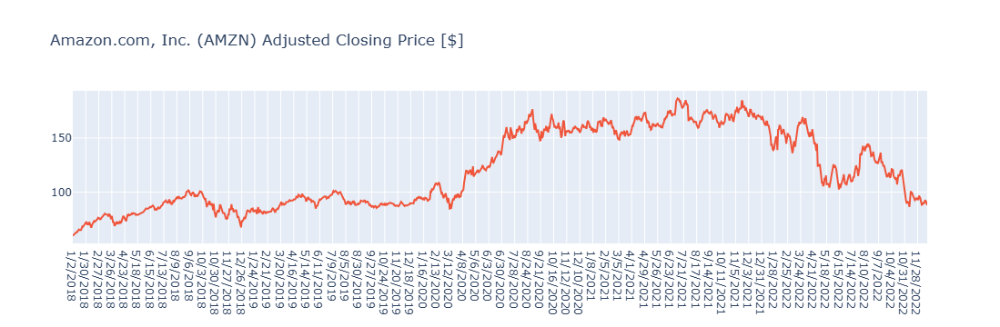

In [29]:
# Plot a Line Plot Using Plotly Express
fig = px.line(title = 'Amazon.com, Inc. (AMZN) Adjusted Closing Price [$]')
fig.add_scatter(x = stock_df['Date'], y = stock_df['Adj Close'], name = 'Adj Close')

In [30]:
stock_df

,Date,Open,High,Low,Close,Volume,Adj Close,Daily Return
0,1/2/2018,58.599998,59.500000,58.525501,59.450500,53890000,59.450500,0.000000
1,1/3/2018,59.415001,60.274502,59.415001,60.209999,62176000,60.209999,1.277531
2,1/4/2018,60.250000,60.793499,60.233002,60.479500,60442000,60.479500,0.447601
3,1/5/2018,60.875500,61.457001,60.500000,61.457001,70894000,61.457001,1.616252
4,1/8/2018,61.799999,62.653999,61.601501,62.343498,85590000,62.343498,1.442468
...,...,...,...,...,...,...,...,...
1245,12/12/2022,89.209999,90.580002,87.870003,90.550003,61999800,90.550003,1.638800
1246,12/13/2022,95.230003,96.250000,90.519997,92.489998,100212000,92.489998,2.142457
1247,12/14/2022,92.500000,93.459999,89.870003,91.580002,70298000,91.580002,-0.983886
1248,12/15/2022,89.889999,89.970001,87.470001,88.449997,84802900,88.449997,-3.417782


In [24]:
# Define a function that performs interactive data visualization using Plotly Express
def plot_financial_data(df, title):
    
    fig = px.line(title = title)
    
    # For loop that plots all stock prices in the pandas dataframe df
    # Note that index starts with 1 because we want to skip the date column
    
    for i in df.columns[1:]:
        fig.add_scatter(x = df['Date'], y = df[i], name = i)
        fig.update_traces(line_width = 5)
        fig.update_layout({'plot_bgcolor': "white"})

    fig.show()

In [25]:
# Plot High, Low, Open, Close and Adj Close
plot_financial_data(stock_df.drop(['Volume', 'Daily Return'], axis = 1), 'Amazon.com, Inc. (AMZN) Stock Price [$]')

In [26]:
# Plot trading volume
plot_financial_data(stock_df.iloc[:,[0,5]], 'Amazon.com, Inc. (AMZN) Trading Volume')

In [27]:
# Plot % Daily Returns
plot_financial_data(stock_df.iloc[:,[0,7]], 'Amazon.com, Inc. (AMZN) Percentage Daily Return [%]')

# PERFORM DATA VISUALIZATION FOR A SINGLE STOCK: PART 2

In [77]:
# Define a function that classifies the returns based on the magnitude
# Feel free to change these numbers
def percentage_return_classifier(percentage_return):
    
    if percentage_return > -0.3 and percentage_return <= 0.3:
        return 'Insignificant Change'
    elif percentage_return > 0.3 and percentage_return <= 3:
        return 'Positive Change'
    elif percentage_return > -3 and percentage_return <= -0.3:
        return 'Negative Change'
    elif percentage_return > 3 and percentage_return <= 7:
        return 'Large Positive Change'
    elif percentage_return > -7 and percentage_return <= -3:
        return 'Large Negative Change'
    elif percentage_return > 7:
        return 'Bull Run'
    elif percentage_return <= -7:
        return 'Bear Sell Off'

In [78]:
# Apply the function to the "Daily Return" Column and place the result in "Trend" column
stock_df['Trend'] = stock_df['Daily Return'].apply(percentage_return_classifier)
stock_df

,Date,Open,High,Low,Close,Volume,Adj Close,Daily Return,Trend
0,1/2/2018,58.599998,59.500000,58.525501,59.450500,53890000,59.450500,0.000000,Insignificant Change
1,1/3/2018,59.415001,60.274502,59.415001,60.209999,62176000,60.209999,1.277531,Positive Change
2,1/4/2018,60.250000,60.793499,60.233002,60.479500,60442000,60.479500,0.447601,Positive Change
3,1/5/2018,60.875500,61.457001,60.500000,61.457001,70894000,61.457001,1.616252,Positive Change
4,1/8/2018,61.799999,62.653999,61.601501,62.343498,85590000,62.343498,1.442468,Positive Change
...,...,...,...,...,...,...,...,...,...
1245,12/12/2022,89.209999,90.580002,87.870003,90.550003,61999800,90.550003,1.638800,Positive Change
1246,12/13/2022,95.230003,96.250000,90.519997,92.489998,100212000,92.489998,2.142457,Positive Change
1247,12/14/2022,92.500000,93.459999,89.870003,91.580002,70298000,91.580002,-0.983886,Negative Change
1248,12/15/2022,89.889999,89.970001,87.470001,88.449997,84802900,88.449997,-3.417782,Large Negative Change


In [79]:
# Count distinct values in the Trend column
trend_summary = stock_df['Trend'].value_counts()
trend_summary

Trend
Positive Change          470
Negative Change          405
Insignificant Change     190
Large Positive Change     86
Large Negative Change     82
Bear Sell Off              9
Bull Run                   8
Name: count, dtype: int64

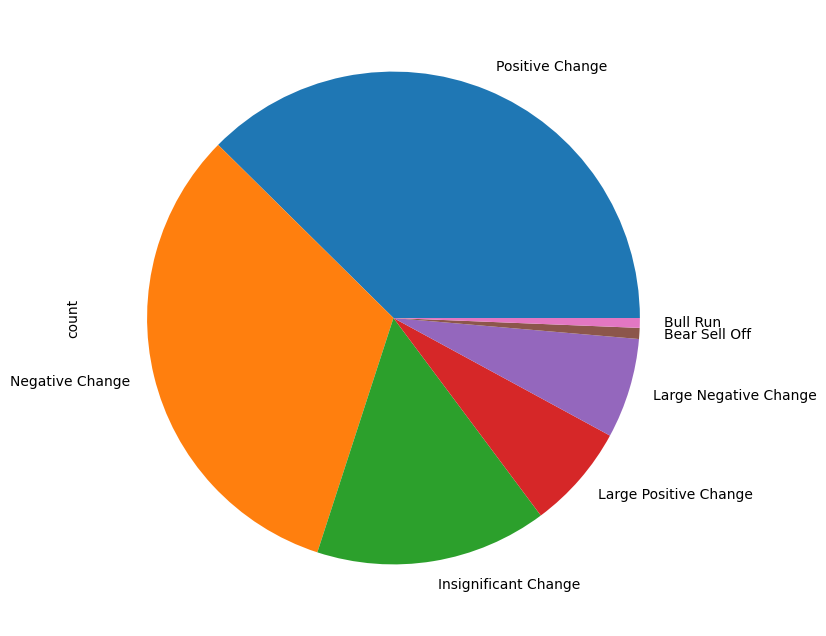

In [80]:
# Plot a pie chart using Matplotlib Library
plt.figure(figsize = (8, 8))
trend_summary.plot(kind = 'pie', y = 'Trend');

# PERFORM DATA VISUALIZATION FOR A SINGLE STOCK: PART 3

In [96]:
# NOw we plot a candlestick graph using Cufflinks library
# Cufflinks is a powerful Python library that connects Pandas and Plotly for generating plots using few lines of code
# Cufflinks allows for interactive data visualization
! pip install cufflinks
!pip install --upgrade cufflinks plotly
import cufflinks as cf
cf.go_offline() # Enabling offline mode for interactive data visualization locally

In [97]:
stock_df = pd.read_csv('dataset\Amazon.csv')
stock_df

,Date,Open,High,Low,Close,Volume,Adj Close
0,1/2/2018,58.599998,59.500000,58.525501,59.450500,53890000,59.450500
1,1/3/2018,59.415001,60.274502,59.415001,60.209999,62176000,60.209999
2,1/4/2018,60.250000,60.793499,60.233002,60.479500,60442000,60.479500
3,1/5/2018,60.875500,61.457001,60.500000,61.457001,70894000,61.457001
4,1/8/2018,61.799999,62.653999,61.601501,62.343498,85590000,62.343498
...,...,...,...,...,...,...,...
1245,12/12/2022,89.209999,90.580002,87.870003,90.550003,61999800,90.550003
1246,12/13/2022,95.230003,96.250000,90.519997,92.489998,100212000,92.489998
1247,12/14/2022,92.500000,93.459999,89.870003,91.580002,70298000,91.580002
1248,12/15/2022,89.889999,89.970001,87.470001,88.449997,84802900,88.449997


In [98]:
# Set the date to be the index for the Pandas DataFrame
# This is critical to show the date on the x-axis when using cufflinks
stock_df.set_index(['Date'], inplace = True)
stock_df

,Open,High,Low,Close,Volume,Adj Close
Date,,,,,,
1/2/2018,58.599998,59.500000,58.525501,59.450500,53890000,59.450500
1/3/2018,59.415001,60.274502,59.415001,60.209999,62176000,60.209999
1/4/2018,60.250000,60.793499,60.233002,60.479500,60442000,60.479500
1/5/2018,60.875500,61.457001,60.500000,61.457001,70894000,61.457001
1/8/2018,61.799999,62.653999,61.601501,62.343498,85590000,62.343498
...,...,...,...,...,...,...
12/12/2022,89.209999,90.580002,87.870003,90.550003,61999800,90.550003
12/13/2022,95.230003,96.250000,90.519997,92.489998,100212000,92.489998
12/14/2022,92.500000,93.459999,89.870003,91.580002,70298000,91.580002


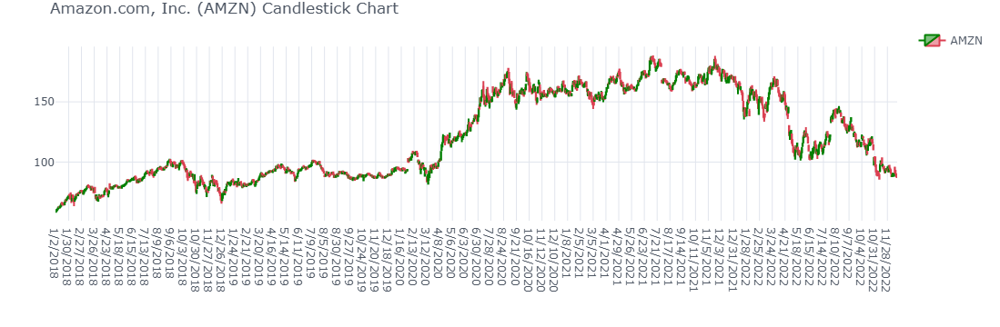

In [102]:
figure = cf.QuantFig(stock_df, title='Amazon.com, Inc. (AMZN) Candlestick Chart', name='AMZN')
#figure.add_sma(periods=[14, 21], column='Close')  # no color arg
figure.iplot(theme='white', up_color='green', down_color='red')

# PERFORM DATA VISUALIZATION FOR MULTIPLE STOCKS

In [31]:
# Now we visualize and read multiple stocks data contained in "stock_prices.csv" attached in the course package 
# The Appendix includes details on how to obtain this data using yfinance and Pandas 
# Note that yfinance and Pandas might experience outage in some geographical regions

# This project uses 10 U.S. stocks for the portfolio used in the simulation, similar analysis could be performed on Asian, European or African stocks  
# AMZN: Amazon Inc. - Multinational tech company focusing on e-commerce, cloud computing, and artificial intelligence
# JPM: JPMorgan Chase and Co. - Multinational investment bank and financial services holding company
# META: Meta Platforms, formerly named Facebook Inc. - META owns Facebook, Instagram, and WhatsApp
# PG: Procter and Gamble (P&G) - Multinational consumer goods corporation
# GOOG: Google (Alphabet Inc.) - Multinational company that focuses on search engine tech, e-commerce, Cloud and AI 
# CAT: Caterpillar - World's largest construction-equipment manufacturer
# PFE: Pfizer Inc. - Multinational pharmaceutical and biotechnology corporation
# EXC: Exelon - An American Fortune 100 energy company 
# DE: Deere & Company (John Deere) - Manufactures agricultural machinery and heavy equipment
# JNJ: Johnson & Johnson - A multinational corporation that develops medical devices and pharmaceuticals

close_price_df = pd.read_csv('dataset\stock_prices.csv')
close_price_df

,Date,AMZN,CAT,DE,EXC,GOOGL,JNJ,JPM,META,PFE,PG
0,1/2/2014,19.898500,69.512543,75.620926,14.121004,27.855856,71.443314,45.640057,54.709999,20.879053,61.941517
1,1/3/2014,19.822001,69.473892,75.956062,13.835152,27.652653,72.086861,45.992889,54.560001,20.920183,61.872295
2,1/6/2014,19.681499,68.561180,75.327690,13.923512,27.960960,72.463608,46.259468,57.200001,20.940746,62.018425
3,1/7/2014,19.901501,68.785461,75.662811,13.996271,28.500000,74.001869,45.726311,57.919998,21.070980,62.618301
4,1/8/2014,20.096001,68.947906,74.850121,13.965082,28.559309,73.899841,46.157543,58.230000,21.214928,61.710812
...,...,...,...,...,...,...,...,...,...,...,...
2252,12/12/2022,90.550003,233.059998,437.049988,42.500000,93.309998,177.839996,134.210007,114.709999,52.160000,152.470001
2253,12/13/2022,92.489998,235.490005,437.190002,42.540001,95.629997,179.210007,134.080002,120.150002,53.070000,152.240005
2254,12/14/2022,91.580002,234.479996,438.440002,42.820000,95.070000,179.759995,133.410004,121.589996,54.480000,152.839996
2255,12/15/2022,88.449997,230.660004,429.790008,42.380001,90.860001,177.490005,130.100006,116.150002,53.610001,151.110001


In [32]:
# Calculate the percentage daily return
# We will perform this calculation on all stocks except for the first column which is "Date"
daily_returns_df = close_price_df.iloc[:, 1:].pct_change() * 100
daily_returns_df.replace(np.nan, 0, inplace = True)
daily_returns_df

,AMZN,CAT,DE,EXC,GOOGL,JNJ,JPM,META,PFE,PG
0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
1,-0.384451,-0.055602,0.443179,-2.024307,-0.729481,0.900780,0.773077,-0.274169,0.196992,-0.111753
2,-0.708814,-1.313748,-0.827284,0.638662,1.114930,0.522629,0.579608,4.838708,0.098293,0.236179
3,1.117807,0.327126,0.444884,0.522567,1.927829,2.122805,-1.152537,1.258737,0.621916,0.967255
4,0.977313,0.236162,-1.074095,-0.222838,0.208102,-0.137872,0.943073,0.535223,0.683156,-1.449240
...,...,...,...,...,...,...,...,...,...,...
2252,1.638800,2.538609,0.515165,2.607441,0.517070,1.194942,1.551152,-1.026749,0.850732,1.027036
2253,2.142457,1.042653,0.032036,0.094120,2.486336,0.770361,-0.096867,4.742396,1.744632,-0.150847
2254,-0.983886,-0.428897,0.285917,0.658201,-0.585588,0.306896,-0.499700,1.198498,2.656868,0.394108
2255,-3.417782,-1.629133,-1.972903,-1.027554,-4.428315,-1.262789,-2.481072,-4.474048,-1.596914,-1.131900


In [33]:
# Insert the date column at the start of the Pandas DataFrame (@ index = 0)
daily_returns_df.insert(0, "Date", close_price_df['Date'])
daily_returns_df

,Date,AMZN,CAT,DE,EXC,GOOGL,JNJ,JPM,META,PFE,PG
0,1/2/2014,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
1,1/3/2014,-0.384451,-0.055602,0.443179,-2.024307,-0.729481,0.900780,0.773077,-0.274169,0.196992,-0.111753
2,1/6/2014,-0.708814,-1.313748,-0.827284,0.638662,1.114930,0.522629,0.579608,4.838708,0.098293,0.236179
3,1/7/2014,1.117807,0.327126,0.444884,0.522567,1.927829,2.122805,-1.152537,1.258737,0.621916,0.967255
4,1/8/2014,0.977313,0.236162,-1.074095,-0.222838,0.208102,-0.137872,0.943073,0.535223,0.683156,-1.449240
...,...,...,...,...,...,...,...,...,...,...,...
2252,12/12/2022,1.638800,2.538609,0.515165,2.607441,0.517070,1.194942,1.551152,-1.026749,0.850732,1.027036
2253,12/13/2022,2.142457,1.042653,0.032036,0.094120,2.486336,0.770361,-0.096867,4.742396,1.744632,-0.150847
2254,12/14/2022,-0.983886,-0.428897,0.285917,0.658201,-0.585588,0.306896,-0.499700,1.198498,2.656868,0.394108
2255,12/15/2022,-3.417782,-1.629133,-1.972903,-1.027554,-4.428315,-1.262789,-2.481072,-4.474048,-1.596914,-1.131900


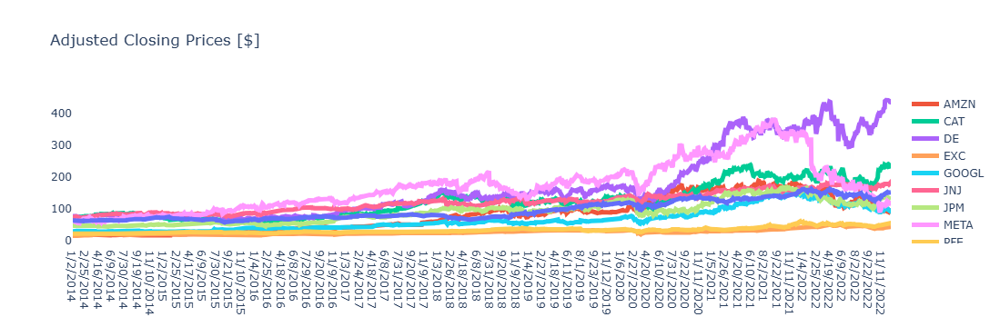

In [34]:
# Plot closing prices using plotly Express. Note that we used the same pre-defined function "plot_financial_data"
plot_financial_data(close_price_df, 'Adjusted Closing Prices [$]')

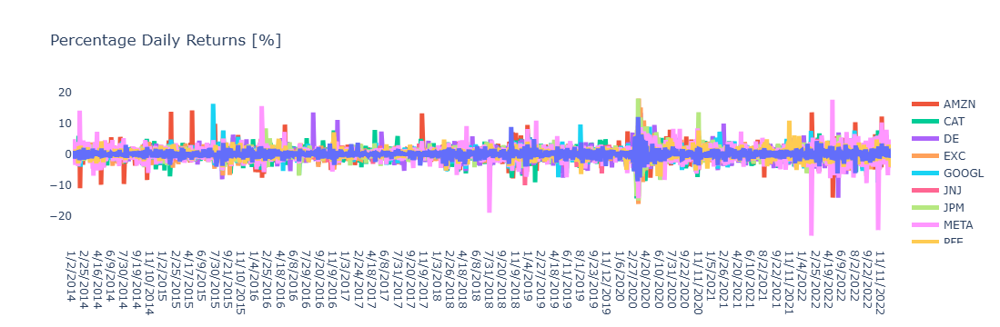

In [35]:
# Plot the stocks daily returns
plot_financial_data(daily_returns_df, 'Percentage Daily Returns [%]')

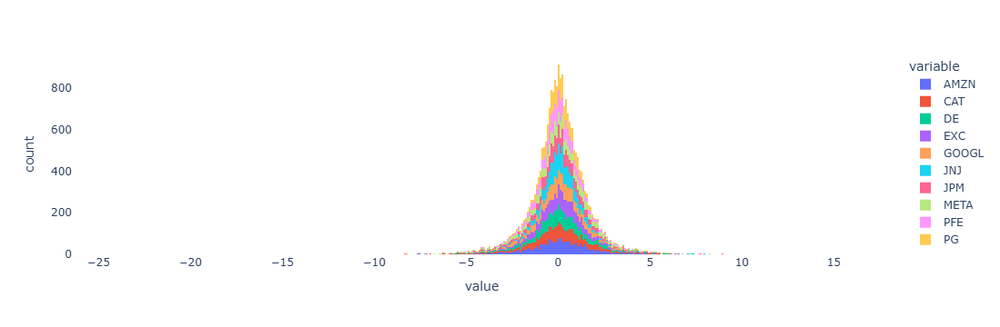

In [36]:
# Plot histograms for stocks daily returns using plotly express
# Compare META to JNJ daily returns histograms
fig = px.histogram(daily_returns_df.drop(columns = ['Date']))
fig.update_layout({'plot_bgcolor': "white"})

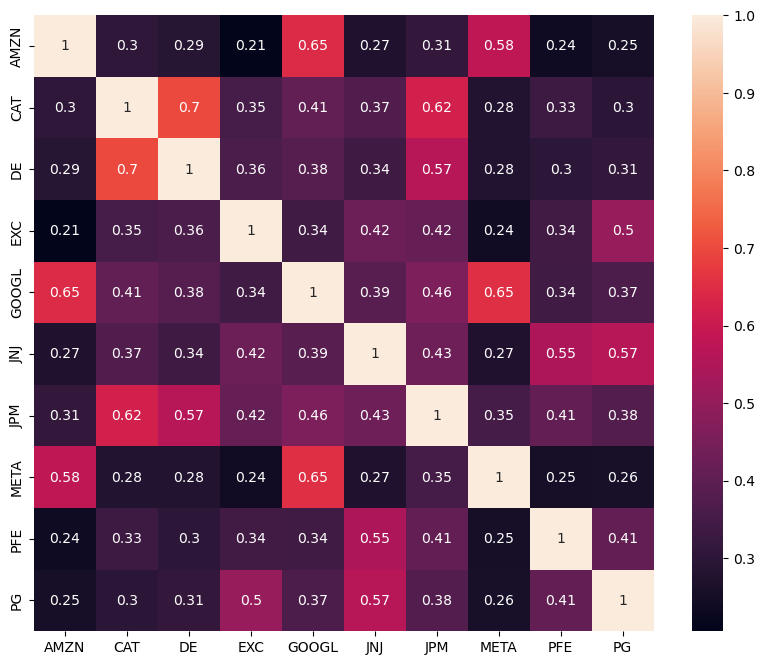

In [37]:
    # Plot a heatmap showing the correlations between daily returns
    # Strong positive correlations between Catterpillar and John Deere - both into heavy equipment and machinery
    # META and Google - both into Tech and Cloud Computing
    plt.figure(figsize = (10, 8))
    sns.heatmap(daily_returns_df.drop(columns = ['Date']).corr(), annot = True);

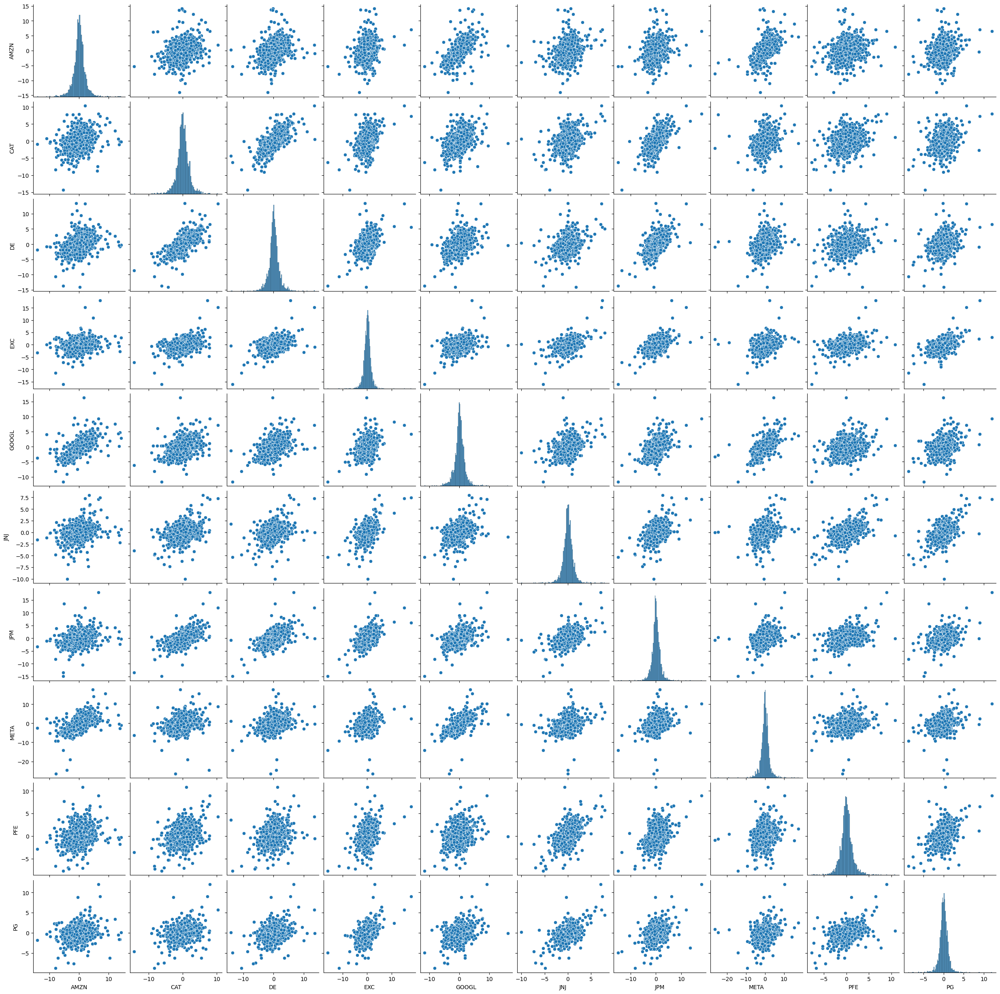

In [38]:
# Plot the Pairplot between stocks daily returns
sns.pairplot(daily_returns_df);

In [39]:
# Function to scale stock prices based on their initial starting price
# The objective of this function is to set all prices to start at a value of 1 
def price_scaling(raw_prices_df):
    scaled_prices_df = raw_prices_df.copy()
    for i in raw_prices_df.columns[1:]:
          scaled_prices_df[i] = raw_prices_df[i]/raw_prices_df[i][0]
    return scaled_prices_df

In [40]:
price_scaling(close_price_df)

,Date,AMZN,CAT,DE,EXC,GOOGL,JNJ,JPM,META,PFE,PG
0,1/2/2014,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000
1,1/3/2014,0.996155,0.999444,1.004432,0.979757,0.992705,1.009008,1.007731,0.997258,1.001970,0.998882
2,1/6/2014,0.989095,0.986314,0.996122,0.986014,1.003773,1.014281,1.013572,1.045513,1.002955,1.001242
3,1/7/2014,1.000151,0.989540,1.000554,0.991167,1.023124,1.035812,1.001890,1.058673,1.009192,1.010926
4,1/8/2014,1.009925,0.991877,0.989807,0.988958,1.025253,1.034384,1.011338,1.064339,1.016087,0.996275
...,...,...,...,...,...,...,...,...,...,...,...
2252,12/12/2022,4.550594,3.352776,5.779485,3.009701,3.349744,2.489246,2.940619,2.096692,2.498198,2.461515
2253,12/13/2022,4.648089,3.387734,5.781336,3.012534,3.433030,2.508422,2.937770,2.196125,2.541782,2.457802
2254,12/14/2022,4.602357,3.373204,5.797866,3.032362,3.412927,2.516121,2.923090,2.222446,2.609314,2.467489
2255,12/15/2022,4.445058,3.318250,5.683480,3.001203,3.261792,2.484347,2.850566,2.123012,2.567645,2.439559


# DEFINE A FUNCTION THAT GENERATES RANDOM PORTFOLIO WEIGHTS

In [44]:
# Let's create an array that holds random portfolio weights
# Note that portfolio weights must add up to 1 
import random

def generate_portfolio_weights(n):
    weights = []
    for i in range(n):
        weights.append(random.random())
        
    # let's make the sum of all weights add up to 1
    weights = weights/np.sum(weights)
    return weights

In [45]:
# Call the function (Run this cell multiple times to generate different outputs)
weights = generate_portfolio_weights(10)
print(weights)

[0.04142465 0.12708485 0.12414641 0.15549872 0.11215484 0.11836103
 0.13864791 0.05996903 0.03939921 0.08331337]


In [46]:
total_weight = sum(weights)
print(total_weight)

1.0000000000000002


# PERFORM ASSET ALLOCATION & CALCULATE PORTFOLIO DAILY VALUE/RETURN

In [47]:
# Let's define the "weights" list similar to the slides
weights = [0.032266, 0.094461, 0.117917, 0.132624, 0.145942, 0.128299, 0.10009, 0.007403, 0.088581, 0.152417]
weights

[0.032266,
 0.094461,
 0.117917,
 0.132624,
 0.145942,
 0.128299,
 0.10009,
 0.007403,
 0.088581,
 0.152417]

In [48]:
close_price_df = pd.read_csv('dataset\stock_prices.csv')
close_price_df

,Date,AMZN,CAT,DE,EXC,GOOGL,JNJ,JPM,META,PFE,PG
0,1/2/2014,19.898500,69.512543,75.620926,14.121004,27.855856,71.443314,45.640057,54.709999,20.879053,61.941517
1,1/3/2014,19.822001,69.473892,75.956062,13.835152,27.652653,72.086861,45.992889,54.560001,20.920183,61.872295
2,1/6/2014,19.681499,68.561180,75.327690,13.923512,27.960960,72.463608,46.259468,57.200001,20.940746,62.018425
3,1/7/2014,19.901501,68.785461,75.662811,13.996271,28.500000,74.001869,45.726311,57.919998,21.070980,62.618301
4,1/8/2014,20.096001,68.947906,74.850121,13.965082,28.559309,73.899841,46.157543,58.230000,21.214928,61.710812
...,...,...,...,...,...,...,...,...,...,...,...
2252,12/12/2022,90.550003,233.059998,437.049988,42.500000,93.309998,177.839996,134.210007,114.709999,52.160000,152.470001
2253,12/13/2022,92.489998,235.490005,437.190002,42.540001,95.629997,179.210007,134.080002,120.150002,53.070000,152.240005
2254,12/14/2022,91.580002,234.479996,438.440002,42.820000,95.070000,179.759995,133.410004,121.589996,54.480000,152.839996
2255,12/15/2022,88.449997,230.660004,429.790008,42.380001,90.860001,177.490005,130.100006,116.150002,53.610001,151.110001


In [49]:
# Scale stock prices using the "price_scaling" function that we defined earlier (make all stock values start at 1)
portfolio_df = close_price_df.copy()
scaled_df = price_scaling(portfolio_df)
scaled_df

,Date,AMZN,CAT,DE,EXC,GOOGL,JNJ,JPM,META,PFE,PG
0,1/2/2014,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000
1,1/3/2014,0.996155,0.999444,1.004432,0.979757,0.992705,1.009008,1.007731,0.997258,1.001970,0.998882
2,1/6/2014,0.989095,0.986314,0.996122,0.986014,1.003773,1.014281,1.013572,1.045513,1.002955,1.001242
3,1/7/2014,1.000151,0.989540,1.000554,0.991167,1.023124,1.035812,1.001890,1.058673,1.009192,1.010926
4,1/8/2014,1.009925,0.991877,0.989807,0.988958,1.025253,1.034384,1.011338,1.064339,1.016087,0.996275
...,...,...,...,...,...,...,...,...,...,...,...
2252,12/12/2022,4.550594,3.352776,5.779485,3.009701,3.349744,2.489246,2.940619,2.096692,2.498198,2.461515
2253,12/13/2022,4.648089,3.387734,5.781336,3.012534,3.433030,2.508422,2.937770,2.196125,2.541782,2.457802
2254,12/14/2022,4.602357,3.373204,5.797866,3.032362,3.412927,2.516121,2.923090,2.222446,2.609314,2.467489
2255,12/15/2022,4.445058,3.318250,5.683480,3.001203,3.261792,2.484347,2.850566,2.123012,2.567645,2.439559


In [50]:
# Use enumerate() method to obtain the stock names along with a counter "i" (0, 1, 2, 3,..etc.)
# This counter "i" will be used as an index to access elements in the "weights" list
initial_investment = 1000000
for i, stock in enumerate(scaled_df.columns[1:]):
    portfolio_df[stock] = weights[i] * scaled_df[stock]  * initial_investment
portfolio_df.round(1)

,Date,AMZN,CAT,DE,EXC,GOOGL,JNJ,JPM,META,PFE,PG
0,1/2/2014,32266.0,94461.0,117917.0,132624.0,145942.0,128299.0,100090.0,7403.0,88581.0,152417.0
1,1/3/2014,32142.0,94408.5,118439.6,129939.3,144877.4,129454.7,100863.8,7382.7,88755.5,152246.7
2,1/6/2014,31914.1,93168.2,117459.8,130769.2,146492.7,130131.3,101448.4,7739.9,88842.7,152606.2
3,1/7/2014,32270.9,93473.0,117982.3,131452.5,149316.8,132893.7,100279.2,7837.4,89395.3,154082.3
4,1/8/2014,32586.3,93693.7,116715.1,131159.6,149627.5,132710.5,101224.9,7879.3,90006.0,151849.3
...,...,...,...,...,...,...,...,...,...,...,...
2252,12/12/2022,146829.5,316706.6,681499.5,399158.6,488868.4,319367.8,294326.5,15521.8,221292.8,375176.8
2253,12/13/2022,149975.2,320008.7,681717.8,399534.3,501023.3,321828.1,294041.4,16257.9,225153.6,374610.9
2254,12/14/2022,148499.6,318636.2,683667.0,402164.0,498089.4,322815.8,292572.1,16452.8,231135.6,376087.2
2255,12/15/2022,143424.3,313445.2,670178.9,398031.6,476032.4,318739.3,285313.2,15716.7,227444.6,371830.3


In [51]:
# We have $1,000,000 capital that we would like to invest in one or more of the selected stocks
# We create a function that receives the following arguments: 
      # (1) Stocks closing prices
      # (2) Random weights 
      # (3) Initial investment amount
# The function will return a DataFrame that contains the following:
      # (1) Daily value (position) of each individual stock over the specified time period
      # (2) Total daily value of the portfolio 
      # (3) Percentage daily return 

def asset_allocation(df, weights, initial_investment):
    portfolio_df = df.copy()

    # Scale stock prices using the "price_scaling" function that we defined earlier (Make them all start at 1)
    scaled_df = price_scaling(df)
  
    for i, stock in enumerate(scaled_df.columns[1:]):
        portfolio_df[stock] = scaled_df[stock] * weights[i] * initial_investment

    # Sum up all values and place the result in a new column titled "portfolio value [$]" 
    # Note that we excluded the date column from this calculation
    portfolio_df['Portfolio Value [$]'] = portfolio_df[portfolio_df != 'Date'].sum(axis = 1, numeric_only = True)
            
    # Calculate the portfolio percentage daily return and replace NaNs with zeros
    portfolio_df['Portfolio Daily Return [%]'] = portfolio_df['Portfolio Value [$]'].pct_change(1) * 100 
    portfolio_df.replace(np.nan, 0, inplace = True)
    
    return portfolio_df

In [52]:
# Now we place this code in a function and generate random weights
# First obtain "n" the number of stocks under consideration (note that we ignored the "Date" column) 
n = len(close_price_df.columns)-1

# Generate random weights 
print('Number of stocks under consideration = {}'.format(n))
weights = generate_portfolio_weights(n).round(6)
print('Portfolio weights = {}'.format(weights))

# Test out the "asset_allocation" function
portfolio_df = asset_allocation(close_price_df, weights, 1000000)
portfolio_df.round(2)

Number of stocks under consideration = 10
Portfolio weights = [0.050066 0.108649 0.151454 0.017751 0.02505  0.066896 0.064428 0.173881
 0.177759 0.164066]


,Date,AMZN,CAT,DE,EXC,GOOGL,JNJ,JPM,META,PFE,PG,Portfolio Value [$],Portfolio Daily Return [%]
0,1/2/2014,50066.00,108649.00,151454.00,17751.00,25050.00,66896.00,64428.00,173881.00,177759.00,164066.00,1000000.00,0.00
1,1/3/2014,49873.52,108588.59,152125.21,17391.67,24867.26,67498.59,64926.08,173404.27,178109.17,163882.65,1000667.01,0.07
2,1/6/2014,49520.01,107162.01,150866.71,17502.74,25144.52,67851.35,65302.40,181794.80,178284.24,164269.71,1007698.48,0.70
3,1/7/2014,50073.55,107512.56,151537.89,17594.20,25629.26,69291.71,64549.76,184083.12,179393.02,165858.62,1015523.68,0.78
4,1/8/2014,50562.92,107766.47,149910.23,17555.00,25682.60,69196.17,65158.51,185068.37,180618.55,163454.93,1014973.74,-0.05
...,...,...,...,...,...,...,...,...,...,...,...,...,...
2252,12/12/2022,227830.06,364275.78,875326.08,53425.20,83911.10,166520.61,189458.19,364574.84,444077.10,403850.99,3173249.96,0.89
2253,12/13/2022,232711.22,368073.91,875606.50,53475.49,85997.41,167803.42,189274.66,381864.43,451824.61,403241.80,3209873.45,1.15
2254,12/14/2022,230421.60,366495.25,878110.01,53827.46,85493.82,168318.40,188328.86,386441.06,463829.00,404831.01,3226096.48,0.51
2255,12/15/2022,222546.29,360524.56,860785.76,53274.36,81707.88,166192.90,183656.28,369151.50,456422.04,400248.73,3154510.31,-2.22


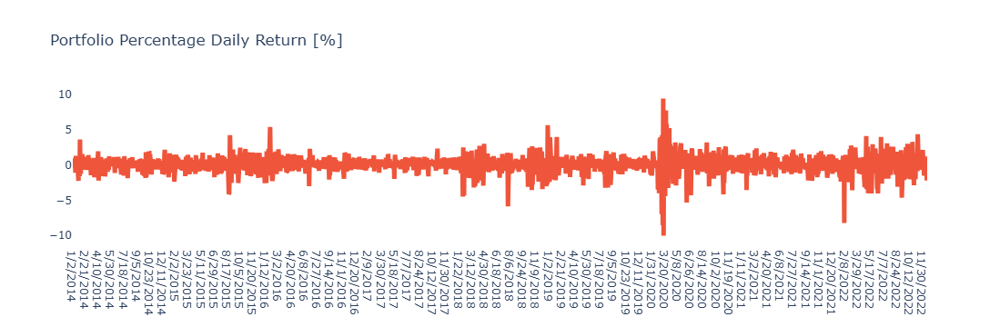

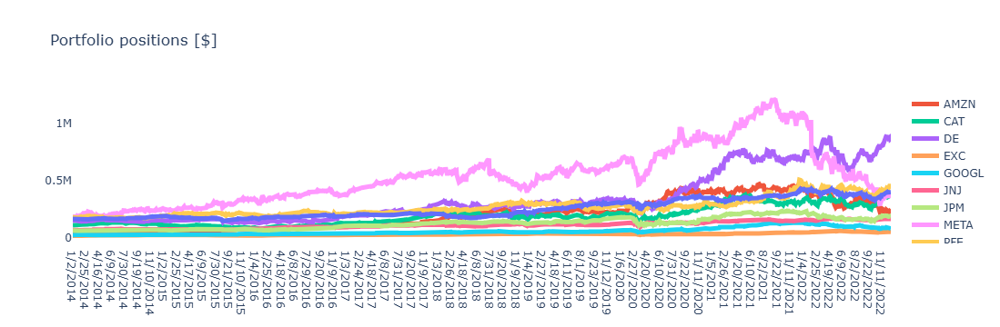

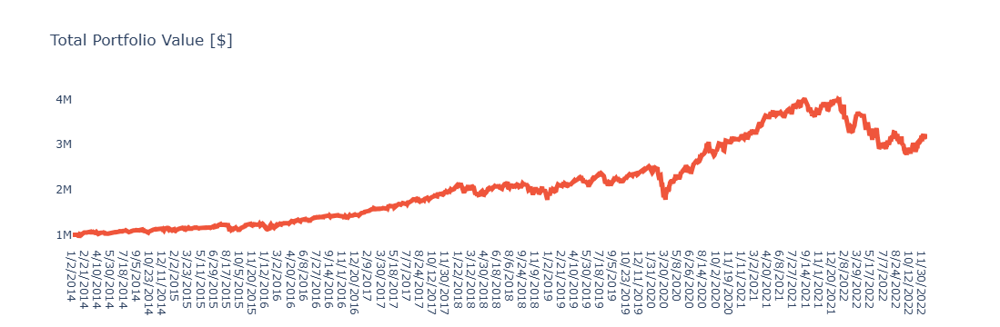

In [53]:
# Plot the portfolio percentage daily return
plot_financial_data(portfolio_df[['Date', 'Portfolio Daily Return [%]']], 'Portfolio Percentage Daily Return [%]')

# Plot each stock position in our portfolio over time
# This graph shows how our initial investment in each individual stock grows over time
plot_financial_data(portfolio_df.drop(['Portfolio Value [$]', 'Portfolio Daily Return [%]'], axis = 1), 'Portfolio positions [$]')

# Plot the total daily value of the portfolio (sum of all positions)
plot_financial_data(portfolio_df[['Date', 'Portfolio Value [$]']], 'Total Portfolio Value [$]')

# DEFINE THE "SIMULATION" FUNCTION THAT PERFORMS ASSET ALLOCATION, AND CALCULATES KEY PORTFOLIO METRICS

In [54]:
# Now we build the simulation engine function 
# The function receives: 
    # (1) portfolio weights
    # (2) initial investment amount
# The function performs asset allocation and calculates portfolio statistical metrics including Sharpe ratio
# The function returns: 
    # (1) Expected portfolio return 
    # (2) Expected volatility 
    # (3) Sharpe ratio 
    # (4) Return on investment 
    # (5) Final portfolio value in dollars


def simulation_engine(weights, initial_investment):
    # Perform asset allocation using the random weights (sent as arguments to the function)
    portfolio_df = asset_allocation(close_price_df, weights, initial_investment)
  
    # Calculate the return on the investment 
    # Return on investment is calculated using the last final value of the portfolio compared to its initial value
    return_on_investment = ((portfolio_df['Portfolio Value [$]'][-1:] - 
                             portfolio_df['Portfolio Value [$]'][0])/ 
                             portfolio_df['Portfolio Value [$]'][0]) * 100
  
    # Daily change of every stock in the portfolio (Note that we dropped the date, portfolio daily worth and daily % returns) 
    portfolio_daily_return_df = portfolio_df.drop(columns = ['Date', 'Portfolio Value [$]', 'Portfolio Daily Return [%]'])
    portfolio_daily_return_df = portfolio_daily_return_df.pct_change(1) 
  
    # Portfolio Expected Return formula
    expected_portfolio_return = np.sum(weights * portfolio_daily_return_df.mean() ) * 252
  
    # Portfolio volatility (risk) formula
    # The risk of an asset is measured using the standard deviation which indicates the dispertion away from the mean
    # The risk of a portfolio is not a simple sum of the risks of the individual assets within the portfolio
    # Portfolio risk must consider correlations between assets within the portfolio which is indicated by the covariance 
    # The covariance determines the relationship between the movements of two random variables
    # When two stocks move together, they have a positive covariance; when they move inversely, the have a negative covariance 

    covariance = portfolio_daily_return_df.cov() * 252 
    expected_volatility = np.sqrt(np.dot(weights.T, np.dot(covariance, weights)))

    # The chart for the 10-years U.S. treasury is at https://ycharts.com/indicators/10_year_treasury_rate
    rf = 0.03 # Try to set the risk free rate of return to 3% (assumption)

    # Calculate Sharpe ratio
    sharpe_ratio = (expected_portfolio_return - rf)/expected_volatility 
    return expected_portfolio_return, expected_volatility, sharpe_ratio, portfolio_df['Portfolio Value [$]'][-1:].values[0], return_on_investment.values[0]
  

In [55]:
# Test out the "simulation_engine" function and print out statistical metrics
# Define the initial investment amount
initial_investment = 1000000
portfolio_metrics = simulation_engine(weights, initial_investment)

In [56]:
print('Expected Portfolio Annual Return = {:.2f}%'.format(portfolio_metrics[0] * 100))
print('Portfolio Standard Deviation (Volatility) = {:.2f}%'.format(portfolio_metrics[1] * 100))
print('Sharpe Ratio = {:.2f}'.format(portfolio_metrics[2]))
print('Portfolio Final Value = ${:.2f}'.format(portfolio_metrics[3]))
print('Return on Investment = {:.2f}%'.format(portfolio_metrics[4]))


Expected Portfolio Annual Return = 16.00%
Portfolio Standard Deviation (Volatility) = 18.11%
Sharpe Ratio = 0.72
Portfolio Final Value = $3144730.97
Return on Investment = 214.47%


# RUN MONTE CARLO SIMULATIONS 

In [ ]:
# Set the number of simulation runs
sim_runs = 10000
initial_investment = 1000000

# Placeholder to store all weights
weights_runs = np.zeros((sim_runs, n))

# Placeholder to store all Sharpe ratios
sharpe_ratio_runs = np.zeros(sim_runs)

# Placeholder to store all expected returns
expected_portfolio_returns_runs = np.zeros(sim_runs)

# Placeholder to store all volatility values
volatility_runs = np.zeros(sim_runs)

# Placeholder to store all returns on investment
return_on_investment_runs = np.zeros(sim_runs)

# Placeholder to store all final portfolio values
final_value_runs = np.zeros(sim_runs)

for i in range(sim_runs):
    # Generate random weights 
    weights = generate_portfolio_weights(n)
    # Store the weights
    weights_runs[i,:] = weights
    
    # Call "simulation_engine" function and store Sharpe ratio, return and volatility
    # Note that asset allocation is performed using the "asset_allocation" function  
    expected_portfolio_returns_runs[i], volatility_runs[i], sharpe_ratio_runs[i], final_value_runs[i], return_on_investment_runs[i] = simulation_engine(weights, initial_investment)
    print("Simulation Run = {}".format(i))  
    print("Weights = {}, Final Value = ${:.2f}, Sharpe Ratio = {:.2f}".format(weights_runs[i].round(3), final_value_runs[i], sharpe_ratio_runs[i]))   
    print('\n')


Simulation Run = 0
Weights = [0.131 0.052 0.145 0.13  0.097 0.058 0.166 0.093 0.003 0.127], Final Value = $3404672.83, Sharpe Ratio = 0.75


Simulation Run = 1
Weights = [0.041 0.153 0.092 0.141 0.073 0.024 0.088 0.089 0.148 0.151], Final Value = $3106477.84, Sharpe Ratio = 0.72


Simulation Run = 2
Weights = [0.045 0.272 0.107 0.031 0.141 0.134 0.032 0.111 0.063 0.063], Final Value = $3242142.99, Sharpe Ratio = 0.71


Simulation Run = 3
Weights = [0.172 0.024 0.168 0.135 0.058 0.092 0.066 0.049 0.126 0.109], Final Value = $3483412.37, Sharpe Ratio = 0.79


Simulation Run = 4
Weights = [0.062 0.095 0.142 0.148 0.058 0.172 0.097 0.002 0.062 0.163], Final Value = $3274835.36, Sharpe Ratio = 0.76


Simulation Run = 5
Weights = [0.062 0.095 0.099 0.166 0.14  0.047 0.147 0.042 0.058 0.145], Final Value = $3217722.15, Sharpe Ratio = 0.73


Simulation Run = 6
Weights = [0.171 0.048 0.083 0.039 0.01  0.213 0.102 0.074 0.197 0.063], Final Value = $3149660.49, Sharpe Ratio = 0.74


Simulation Ru

# PERFORM PORTFOLIO OPTIMIZATION 

In [46]:
# List all Sharpe ratios generated from the simulation
sharpe_ratio_runs

array([0.69187102, 0.71862754, 0.7149231 , ..., 0.72478088, 0.76928663,
       0.73824303])

In [47]:
# Return the index of the maximum Sharpe ratio (Best simulation run) 
sharpe_ratio_runs.argmax()

9880

In [48]:
# Return the maximum Sharpe ratio value
sharpe_ratio_runs.max()

0.8134577878445453

In [49]:
weights_runs

array([[0.00151423, 0.0882885 , 0.0856838 , ..., 0.07895504, 0.14453338,
        0.04601701],
       [0.00606426, 0.04611018, 0.21289134, ..., 0.21047429, 0.16475692,
        0.00213894],
       [0.067014  , 0.10531505, 0.14687193, ..., 0.15007111, 0.03126547,
        0.03781995],
       ...,
       [0.02087533, 0.16735469, 0.20185975, ..., 0.01605282, 0.00179221,
        0.07359609],
       [0.17614891, 0.14766255, 0.10104487, ..., 0.0380627 , 0.12200422,
        0.16164533],
       [0.1511333 , 0.09623488, 0.12475352, ..., 0.09262145, 0.09879023,
        0.10308668]])

In [50]:
# Obtain the portfolio weights that correspond to the maximum Sharpe ratio (Golden set of weights!)
weights_runs[sharpe_ratio_runs.argmax(), :]

array([0.23728183, 0.02634051, 0.22321932, 0.09249519, 0.09294832,
       0.15206692, 0.02107662, 0.01518317, 0.09420327, 0.04518483])

In [51]:
# Return Sharpe ratio, volatility corresponding to the best weights allocation (maximum Sharpe ratio)
optimal_portfolio_return, optimal_volatility, optimal_sharpe_ratio, highest_final_value, optimal_return_on_investment = simulation_engine(weights_runs[sharpe_ratio_runs.argmax(), :], initial_investment)

In [52]:
print('Best Portfolio Metrics Based on {} Monte Carlo Simulation Runs:'.format(sim_runs))
print('  - Portfolio Expected Annual Return = {:.02f}%'.format(optimal_portfolio_return * 100))
print('  - Portfolio Standard Deviation (Volatility) = {:.02f}%'.format(optimal_volatility * 100))
print('  - Sharpe Ratio = {:.02f}'.format(optimal_sharpe_ratio))
print('  - Final Value = ${:.02f}'.format(highest_final_value))
print('  - Return on Investment = {:.02f}%'.format(optimal_return_on_investment))

Best Portfolio Metrics Based on 10000 Monte Carlo Simulation Runs:
  - Portfolio Expected Annual Return = 18.05%
  - Portfolio Standard Deviation (Volatility) = 18.50%
  - Sharpe Ratio = 0.81
  - Final Value = $3792621.73
  - Return on Investment = 279.26%


In [53]:
# Create a DataFrame that contains volatility, return, and Sharpe ratio for all simualation runs
sim_out_df = pd.DataFrame({'Volatility': volatility_runs.tolist(), 'Portfolio_Return': expected_portfolio_returns_runs.tolist(), 'Sharpe_Ratio': sharpe_ratio_runs.tolist() })
sim_out_df

,Volatility,Portfolio_Return,Sharpe_Ratio
0,0.178730,0.153658,0.691871
1,0.183405,0.161800,0.718628
2,0.197183,0.170971,0.714923
3,0.172437,0.148876,0.689388
4,0.180259,0.161118,0.727388
...,...,...,...
9995,0.175099,0.164859,0.770187
9996,0.175736,0.153037,0.700120
9997,0.198677,0.173997,0.724781
9998,0.179894,0.168390,0.769287


In [54]:
# Plot volatility vs. return for all simulation runs
# Highlight the volatility and return that corresponds to the highest Sharpe ratio
import plotly.graph_objects as go
fig = px.scatter(sim_out_df, x = 'Volatility', y = 'Portfolio_Return', color = 'Sharpe_Ratio', size = 'Sharpe_Ratio', hover_data = ['Sharpe_Ratio'] )
fig.update_layout({'plot_bgcolor': "white"})
fig.show()


# Use this code if Sharpe ratio is negative
# fig = px.scatter(sim_out_df, x = 'Volatility', y = 'Portfolio_Return', color = 'Sharpe_Ratio', hover_data = ['Sharpe_Ratio'] )


In [55]:
# Highlight the optimal portfolio point with the highest Sharpe ratio
fig = px.scatter(sim_out_df, x = 'Volatility', y = 'Portfolio_Return', color = 'Sharpe_Ratio', size = 'Sharpe_Ratio', hover_data = ['Sharpe_Ratio'] )
fig.add_trace(go.Scatter(x = [optimal_volatility], y = [optimal_portfolio_return], mode = 'markers', name = 'Optimal Point', marker = dict(size=[40], color = 'red')))
fig.update_layout(coloraxis_colorbar = dict(y = 0.7, dtick = 5))
fig.update_layout({'plot_bgcolor': "white"})
fig.show()

- **Using Plotly Express, we can dig deeper the following tasks:** 
     - **plot the portfolio volatility (y-axis) vs. simulation run number (x-axis)**
     - **Plot the portfolio return (y-axis) vs. simulation run number (x-axis)**
     - **Plot the Sharpe ratio (y-axis) vs. simulation run number (x-axis)**

# APPENDIX

In [ ]:
!pip install pandas_datareader
!pip install yfinance

In [11]:
# Code to obtain stock data using Pandas Datareader
# Select the start/end dates and ticker symbols
# Data is saved in a stock_data.csv file
#tickers = ['AMZN'] 
tickers = ['AMZN', 'JPM', 'META', 'PG', 'GOOGL', 'CAT', 'PFE', 'EXC', 'DE', 'JNJ'] 

import datetime as dt
import yfinance as yf
import pandas as pd

# Indicate the start and end dates
start = dt.datetime(2018, 1, 1)
end = dt.datetime.now()

# Use yfinance directly instead of pandas_datareader with override
# This is the updated way to fetch data with yfinance
df = yf.download(tickers, start=start, end=end)
print(df)
df.to_csv('stock_data.csv')

C:\Users\FUJITSU\AppData\Local\Temp\ipykernel_11608\3573017815.py:17: FutureWarning: YF.download() has changed argument auto_adjust default to True
  df = yf.download(tickers, start=start, end=end)
[*********************100%***********************]  1 of 1 completed

Price            Close        High         Low        Open    Volume
Ticker            AMZN        AMZN        AMZN        AMZN      AMZN
Date                                                                
2018-01-02   59.450500   59.500000   58.525501   58.599998  53890000
2018-01-03   60.209999   60.274502   59.415001   59.415001  62176000
2018-01-04   60.479500   60.793499   60.233002   60.250000  60442000
2018-01-05   61.457001   61.457001   60.500000   60.875500  70894000
2018-01-08   62.343498   62.653999   61.601501   61.799999  85590000
...                ...         ...         ...         ...       ...
2025-09-02  225.339996  226.169998  221.830002  223.520004  38843900
2025-09-03  225.990005  227.169998  224.360001  225.210007  29223100
2025-09-04  235.679993  235.770004  230.779999  231.190002  59391800
2025-09-05  232.330002  236.000000  231.929993  235.190002  36694400
2025-09-08  236.919998  237.600006  233.750000  234.966995  16609788

[1931 rows x 5 columns]
